In [1]:
import numpy as np
import scipy
from findiff import FinDiff
import matplotlib.pyplot as plt
import time

In [2]:
# Create the grid
box_size = 300
npoints = 60

x = y = z = np.linspace(-box_size/2, box_size/2, npoints)
dx = dy = dz = x[1] - x[0]
X, Y, Z = np.meshgrid(x, y, z, indexing='ij')

In [3]:
# define helper functions

# take a mid slice
sl = lambda x: x[npoints//2, npoints//2, :]

# take a volumetric propability density
pr = lambda x: (x * np.conj(x)).real

# normalized propability
prn = lambda x: pr(x) / np.sum(pr(x))

def slice_plot(x, y):
    plt.plot(sl(x), sl(y))

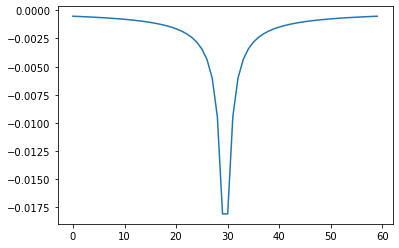

In [4]:
# Define potential
r = np.sqrt(X**2 + Y**2 + Z**2)
V = -1  / (4*np.pi * r)

plt.plot(sl(V))
plt.show()

In [5]:
# define an Hamiltonian
acc = 2

V_matrix = scipy.sparse.diags(V.reshape(-1))
laplace = FinDiff(0, dx, 2, acc=acc) + FinDiff(1, dy, 2, acc=acc) + FinDiff(2, dz, 2, acc=acc)
T = -0.5 * laplace.matrix(X.shape)
H = T + V_matrix

In [14]:
# solve
a_0 = 4 * np.pi
psi_0 = 2 / a_0 ** 1.5 * np.exp(-r / a_0)

k = 8
energies, functions = scipy.sparse.linalg.eigs(H, which='SR', k=k, v0=psi_0)

print(energies)
states = [(energies[i], functions[:, i].reshape(X.shape)) for i in range(k)]


[-0.00305225+0.00000000e+00j -0.00077887+0.00000000e+00j
 -0.00079385+2.29530321e-14j -0.00079385-2.29530321e-14j
 -0.00079385+0.00000000e+00j -0.00044855+0.00000000e+00j
 -0.00044855+0.00000000e+00j -0.00044855+0.00000000e+00j]


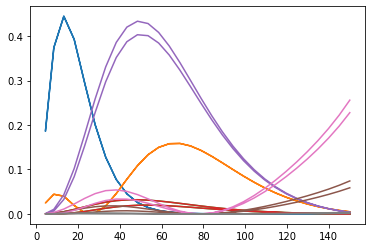

In [15]:
# radial density
for E, psi in states:
    slice_plot(r, prn(psi) * r**2)

plt.show()

<ipython-input-16-0e0fa3a0249d>:2: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(X[:, :, npoints//2], Y[:, :, npoints//2], prn(psi[:, :, npoints//2]))


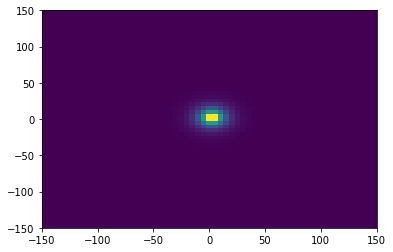

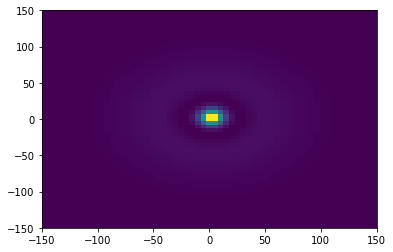

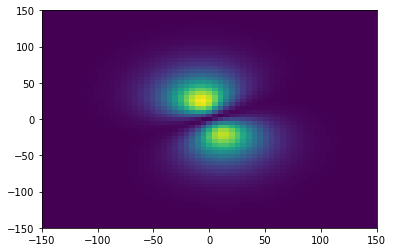

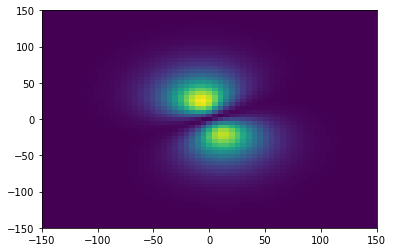

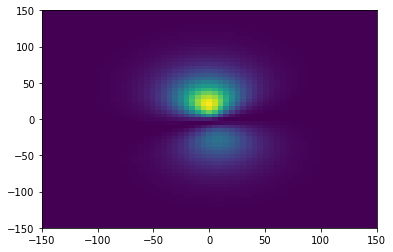

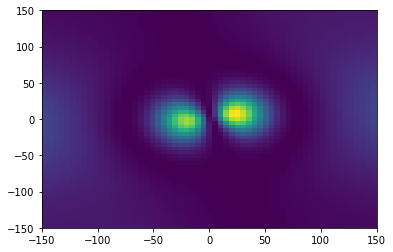

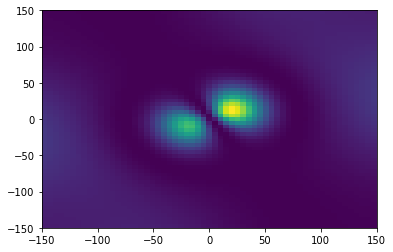

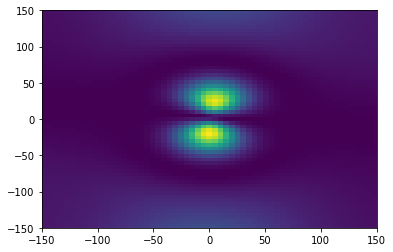

In [16]:
for E, psi in states:
    plt.pcolormesh(X[:, :, npoints//2], Y[:, :, npoints//2], prn(psi[:, :, npoints//2]))
    plt.show()

<ipython-input-17-f3fe2b7908f6>:2: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(Y[npoints//2, :, :], Z[npoints//2, :, :], prn(psi[npoints//2, :, :]))


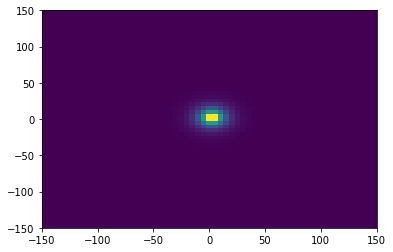

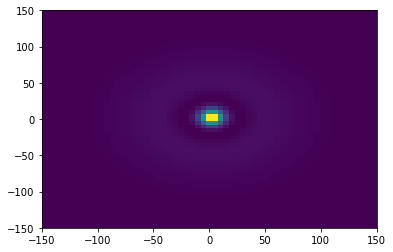

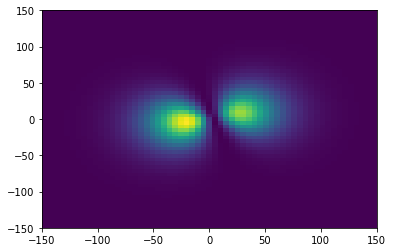

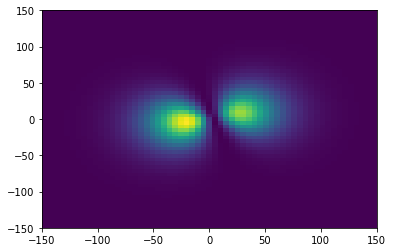

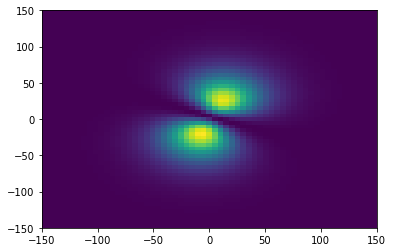

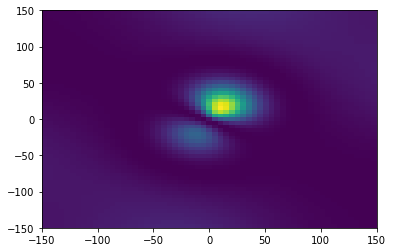

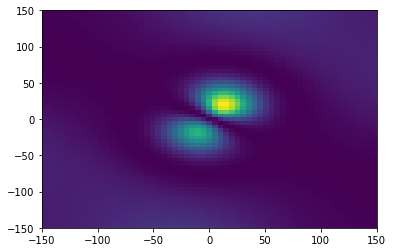

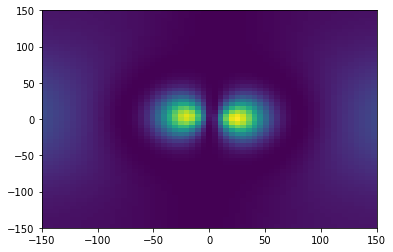

In [17]:
for E, psi in states:
    plt.pcolormesh(Y[npoints//2, :, :], Z[npoints//2, :, :], prn(psi[npoints//2, :, :]))
    plt.show()

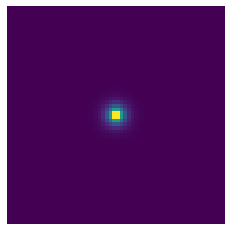

In [22]:
for n, (E, psi) in enumerate(states):
    plt.imshow(prn(psi[npoints//2, :, :]))
    # plt.show()
    plt.axis('off')
    plt.savefig("hydrgoen/"+str(n)+'.png', bbox_inches='tight')